In [50]:
import torch 
import numpy as np
import matplotlib.pyplot as plt
import math
import torch.nn.functional as F

# Cosine Scheduler

[0.0, 1.0204081535339355, 2.040816307067871, 3.0612244606018066, 4.081632614135742, 5.102040767669678, 6.122448921203613, 7.142857074737549, 8.163265228271484, 9.183673858642578, 10.204081535339355, 11.224489212036133, 12.244897842407227, 13.26530647277832, 14.285714149475098, 15.306121826171875, 16.32653045654297, 17.346939086914062, 18.367347717285156, 19.387754440307617, 20.40816307067871, 21.428571701049805, 22.448978424072266, 23.46938705444336, 24.489795684814453, 25.510204315185547, 26.53061294555664, 27.551021575927734, 28.571428298950195, 29.59183692932129, 30.612245559692383, 31.632652282714844, 32.65306091308594, 33.67346954345703, 34.693878173828125, 35.71428680419922, 36.73469543457031, 37.755104064941406, 38.775508880615234, 39.79591751098633, 40.81632614135742, 41.836734771728516, 42.85714340209961, 43.8775520324707, 44.8979606628418, 45.918365478515625, 46.93877410888672, 47.95918273925781, 48.979591369628906, 50.0]
[0.9993684783030087, 0.9968056552600042, 0.99228216726

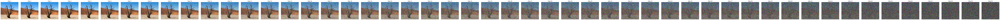

In [59]:
STEPS = 50
s = 0.008
val = torch.linspace(0,STEPS,STEPS).tolist()
print(val)
fs = []
for i in range(len(val)+1):
    f = math.cos(((i/STEPS + s)/1+s )*(math.pi/2))**2
    fs.append(f)
print(fs)
alpha_bars=[]
for i in range(STEPS+1):
    alpha_bar = fs[i]/fs[0]
    alpha_bars.append(alpha_bar)
print(alpha_bars)
betas = []
for t in range(1, len(alpha_bars)):
    beta = 1 - alpha_bars[t] / alpha_bars[t-1]
    betas.append(beta)

betas = torch.tensor(betas)

betas = torch.clamp(betas, 1e-8, 0.999).tolist()
print(betas)

image = plt.imread("/Users/lakshit.karsoliya/workdir/DiffusionModels/square_resolution_image.jpg")
if image.dtype == np.uint8:
    image = image / 255.0 

image = torch.from_numpy(image).permute(2,0,1).unsqueeze(0).float()
image = F.interpolate(image, size=(256,256), mode="bilinear", align_corners=False)
print("Resized image shape:", image.shape)

noised_images = []
for i in range(STEPS):
    sqrt_alpha_hat = torch.sqrt(torch.tensor(alpha_bars[i], dtype=torch.float32)).view(1,1,1,1)
    sqrt_one_minus_alpha_hat = torch.sqrt(1 - torch.tensor(alpha_bars[i], dtype=torch.float32)).view(1,1,1,1)
    E = torch.randn_like(image)
    noised = sqrt_alpha_hat * image + sqrt_one_minus_alpha_hat * E
    noised_images.append(noised)

fig, axes = plt.subplots(1, STEPS, figsize=(3*STEPS, 3))
for i, img in enumerate(noised_images):
    img_np = img.squeeze(0).permute(1,2,0).cpu().numpy()
    img_np = np.clip(img_np, 0, 1)
    
    axes[i].imshow(img_np)
    axes[i].set_title(f"Step {i+1}")
    axes[i].axis("off")
plt.tight_layout()
plt.show()